In [2]:
import numpy as np
import pandas as pd
from io import StringIO
import matplotlib.pylab as plt
from scipy import stats
import os
import zipfile
from urllib.request import urlretrieve
import seaborn as sns
import requests
from bs4 import BeautifulSoup
import xarray as xr
import cartopy


# **CORAL BLEACHING VARIABLES AND DATA**

# Sea Surface Temperature

## 📂 Opening a NetCDF (.nc) File

This first code cell demonstrates how to **open a NetCDF (`.nc`) file** using Python.  
The primary variable in this example is **Sea Surface Temperature (SST)**, which is originally measured in **Kelvin**, but can easily be converted to **Celsius** or **Fahrenheit**.

> 🔁 **Tip:** You can use this code as a **template** for opening and reading other variables from `.nc` files, assuming your files are already downloaded locally.

Before working with environmental data in a NetCDF (`.nc`) format, it's important to:

1. **Check if the file exists** at the specified path.
2. **Safely load the dataset** using `xarray`, a powerful library for handling multi-dimensional scientific data.
3. **Print the dataset structure** to get an overview of the variables and dimensions it contains.

> ⚠️ If the file doesn’t exist or is corrupted, the code will inform you and list the files in the directory to help with troubleshooting.

This ensures that the workflow is both **reproducible** and **robust against errors**, especially in large projects where datasets may be moved or renamed.

In [3]:
# === STEP 1: Check if the file exists and then load the NetCDF file ===
file_path = 'Data/Project Data/cmems_obs-sst_glo_phy_my_l4_P1D-m_1744382931760.nc'

# Check if the file exists
if os.path.exists(file_path):
    # File exists, try to open it
    try:
        ds_sst = xr.open_dataset(file_path)
        # === STEP 2: View dataset structure ===
        print(ds_sst)
    except Exception as e:
        print(f"Error opening the file: {e}")
        print("The file might be corrupted or in an incompatible format.")
else:
    print(f"File not found: {file_path}")
    print("Please check the file path and make sure the file exists.")
    
    # You might want to list available files in the directory
    directory = os.path.dirname(file_path)
    if os.path.exists(directory):
        print(f"\nFiles in {directory}:")
        for f in os.listdir(directory):
            print(f"- {f}")
    else:
        print(f"\nDirectory not found: {directory}")

ds_sst

<xarray.Dataset>
Dimensions:       (time: 1277, latitude: 70, longitude: 70)
Coordinates:
  * time          (time) datetime64[ns] 2018-01-01 2018-01-02 ... 2021-06-30
  * latitude      (latitude) float32 24.05 24.15 24.25 ... 30.75 30.85 30.95
  * longitude     (longitude) float32 -86.95 -86.85 -86.75 ... -80.15 -80.05
Data variables:
    analysed_sst  (time, latitude, longitude) float32 ...
Attributes:
    Conventions:       CF-1.11
    title:             Merged collation of sea surface temperature from multi...
    institution:       Institut Francais de Recherche pour l Exploitation de ...
    source:            Odyssea-RepL4 Processor
    history:           file originally produced by Ifremer/Cersat with Odysse...
    contact:           jean.francois.piolle@ifremer.fr;emmanuelle.autret@ifre...
    references:        Product User Manual for Level 4 ODYSSEA Sea Surface Te...
    comment:           WARNING:Some applications are unable to properly handl...
    subset:source:     ARCO d

<xarray.Dataset>
Dimensions:       (time: 1277, latitude: 70, longitude: 70)
Coordinates:
  * time          (time) datetime64[ns] 2018-01-01 2018-01-02 ... 2021-06-30
  * latitude      (latitude) float32 24.05 24.15 24.25 ... 30.75 30.85 30.95
  * longitude     (longitude) float32 -86.95 -86.85 -86.75 ... -80.15 -80.05
Data variables:
    analysed_sst  (time, latitude, longitude) float32 ...
Attributes:
    Conventions:       CF-1.11
    title:             Merged collation of sea surface temperature from multi...
    institution:       Institut Francais de Recherche pour l Exploitation de ...
    source:            Odyssea-RepL4 Processor
    history:           file originally produced by Ifremer/Cersat with Odysse...
    contact:           jean.francois.piolle@ifremer.fr;emmanuelle.autret@ifre...
    references:        Product User Manual for Level 4 ODYSSEA Sea Surface Te...
    comment:           WARNING:Some applications are unable to properly handl...
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  SST_GLO_PHY_L4_MY_010_044
    subset:datasetId:  cmems_obs-sst_glo_phy_my_l4_P1D-m_202411
    subset:date:       2025-04-11T14:48:51.760Z

## 📈 Step 2: Generate Monthly SST Summary and Time-Series Plot

This section focuses on creating a **temporal summary** of sea surface temperature (SST) by calculating and visualizing **monthly statistics** (minimum, maximum, and mean) from the dataset.

### 🧭 What This Code Does:

1. **Selects the SST variable** (`analysed_sst`) from the dataset and verifies its existence.
2. **Averages SST values over latitude and longitude**, resulting in a single time series.
3. **Converts the temperature from Kelvin to Celsius** for easier interpretation.
4. **Converts the processed data to a Pandas DataFrame**, making it easier to manipulate and analyze.
5. **Groups the data by month** and calculates:
   - **Minimum SST**
   - **Maximum SST**
   - **Mean SST**
6. **Plots the monthly temperature trends** using `matplotlib`, clearly distinguishing between min, max, and mean values.
7. **Saves the plot** as a high-resolution PNG file.
8. **Formats the DataFrame** professionally for display:
   - Columns renamed for clarity
   - Rounded values
   - `Month` set as the index for clean tabular output

> 📌 This approach is ideal for analyzing **seasonal trends** in ocean temperature and can be easily adapted to other time-based environmental variables.


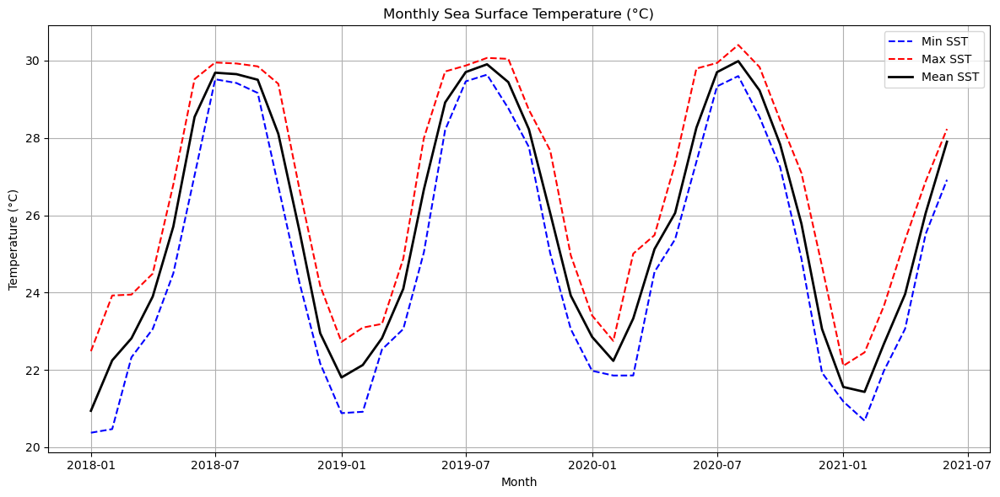


===== Monthly Sea Surface Temperature Summary (°C) =====


,Minimum SST (°C),Maximum SST (°C),Mean SST (°C)
Month,,,
2018-01-01,20.379999,22.490000,20.940001
2018-02-01,20.469999,23.930000,22.250000
2018-03-01,22.330000,23.950001,22.820000
2018-04-01,23.059999,24.490000,23.900000
2018-05-01,24.500000,26.790001,25.709999


In [4]:
# === 1. Select and convert SST variable from ds_sst ===
sst_var = 'analysed_sst'  # Change if different
if sst_var not in ds_sst.data_vars:
    raise ValueError(f"'{sst_var}' not found in dataset.")

sst = ds_sst[sst_var]

# === 2. Take spatial average if needed ===
if 'latitude' in sst.dims and 'longitude' in sst.dims:
    sst = sst.mean(dim=['latitude', 'longitude'])

# === 3. Convert to Celsius (assume input is in Kelvin) ===
sst_c = sst - 273.15

# === 4. Convert to Pandas DataFrame ===
sst_df = sst_c.to_dataframe(name='sst').reset_index()

# === 5. Group by month and calculate statistics ===
sst_df['month'] = sst_df['time'].dt.to_period('M')
monthly_stats = sst_df.groupby('month')['sst'].agg(['min', 'max', 'mean']).reset_index()
monthly_stats['month'] = monthly_stats['month'].dt.to_timestamp()

# === 6. Plot the monthly min, max, and mean ===
plt.figure(figsize=(12, 6))
plt.plot(monthly_stats['month'], monthly_stats['min'], label='Min SST', linestyle='--', color='blue')
plt.plot(monthly_stats['month'], monthly_stats['max'], label='Max SST', linestyle='--', color='red')
plt.plot(monthly_stats['month'], monthly_stats['mean'], label='Mean SST', color='black', linewidth=2)

plt.title("Monthly Sea Surface Temperature (°C)")
plt.xlabel("Month")
plt.ylabel("Temperature (°C)")
plt.legend()
plt.grid(True)
plt.tight_layout()


# === Save figure as PNG ===
plt.savefig("monthly_sst_plot.png", dpi=300)

plt.show()

# === 7. Format and display the DataFrame professionally ===

# Rename columns for clarity
monthly_stats.columns = ['Month', 'Minimum SST (°C)', 'Maximum SST (°C)', 'Mean SST (°C)']

# Round to 2 decimal places
monthly_stats = monthly_stats.round(2)

# Set Month as index for cleaner layout
monthly_stats.set_index('Month', inplace=True)

# Display table with title
print("\n===== Monthly Sea Surface Temperature Summary (°C) =====")
display(monthly_stats.head())


## 🌊 Step 3: Extract and Visualize Sea Surface Temperature (SST)

This step walks through the **extraction, processing, and visualization** of sea surface temperature (SST) data from the loaded NetCDF dataset.

### 🔍 Breakdown of Actions:

1. **Inspect available variables** in the dataset and check if the expected SST variable (`analysed_sst`) exists.
2. **Select the SST variable** and slice it to extract the surface-level data (first time step and depth).
3. **Convert SST values from Kelvin to Celsius** for easier interpretation.
4. **Retrieve latitude and longitude arrays** and compute their respective grid edges for precise plotting.
5. **Plot the SST data using `matplotlib` and `cartopy`** with a global projection:
   - Uses `pcolormesh` for a smooth shaded visualization.
   - Adds coastlines, land features, and borders for context.
   - Includes a color bar to indicate temperature scale.

> 📌 This step is crucial for **understanding the spatial distribution** of ocean temperature and is fully customizable for other variables in similar datasets.


Variables available: ['analysed_sst']
Sea Surface Temperature dimensions: ('time', 'latitude', 'longitude')


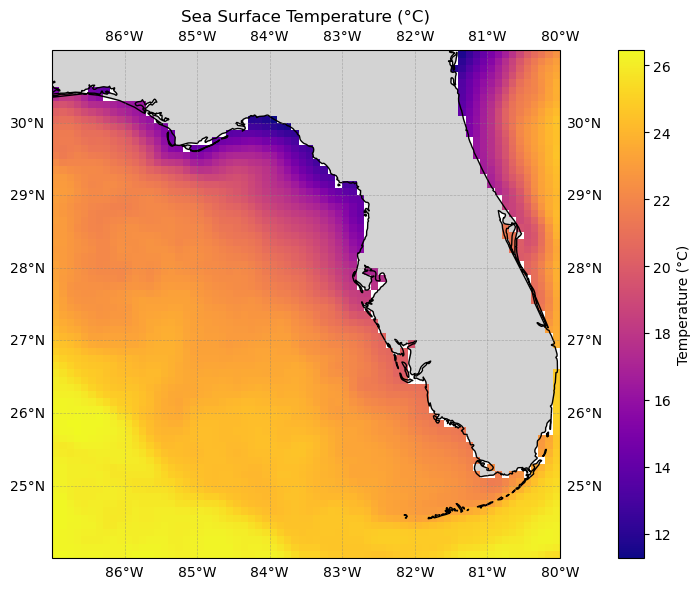

In [5]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

# === 1. Inspect variables ===
print("Variables available:", list(ds_sst.data_vars.keys()))

# === 2. Set SST variable name ===
sst_var = 'analysed_sst'

if sst_var not in ds_sst.data_vars:
    print(f"Warning: '{sst_var}' not found in dataset.")
    print("Available variables are:", list(ds_sst.data_vars.keys()))
else:
    sst = ds_sst[sst_var]
    print("Sea Surface Temperature dimensions:", sst.dims)

    # === 3. Select surface slice ===
    if 'time' in sst.dims and 'depth' in sst.dims:
        sst_slice = sst.isel(time=0, depth=0)
    elif 'time' in sst.dims:
        sst_slice = sst.isel(time=0)
    else:
        sst_slice = sst

    # === 4. Convert to Celsius ===
    sst_celsius = sst_slice - 273.15

    # === 5. Get lat/lon ===
    lat = ds_sst['latitude'].values
    lon = ds_sst['longitude'].values
    data = sst_celsius.values  # Converted values

    # === 6. Compute grid edges ===
    def compute_edges(coord):
        mid = 0.5 * (coord[1:] + coord[:-1])
        first = coord[0] - (mid[0] - coord[0])
        last = coord[-1] + (coord[-1] - mid[-1])
        return np.concatenate([[first], mid, [last]])

    lat_edges = compute_edges(lat)
    lon_edges = compute_edges(lon)

    # === 7. Plot with Cartopy ===
    fig, ax = plt.subplots(figsize=(12, 6), subplot_kw={'projection': ccrs.PlateCarree()})
    mesh = ax.pcolormesh(lon_edges, lat_edges, data, cmap='plasma', shading='auto', transform=ccrs.PlateCarree())

    ax.set_title("Sea Surface Temperature (°C)")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    ax.coastlines()
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')

    plt.colorbar(mesh, ax=ax, orientation='vertical', label='Temperature (°C)')
    plt.tight_layout()
    plt.show()


## 🌍 Step 4: Animate Sea Surface Temperature Over Time

This section creates a **dynamic visualization** of sea surface temperature (SST) changes across the globe, using satellite data stored in a NetCDF (`.nc`) file.

### 🎬 What This Code Does:

1. **Loads the dataset** and selects the SST variable, converting its values from Kelvin to Celsius.
2. **Computes grid edges** from latitude and longitude arrays to ensure accurate spatial representation when using `pcolormesh`.
3. **Sets up a base map** using `Cartopy`, with coastlines, land masses, and gridlines for geographic context.
4. **Initializes a global SST plot** using the first time frame in the dataset.
5. **Defines an `update()` function** that updates the plotted SST data and title for each time frame.
6. **Generates an animation** showing how SST evolves over time, using ~30-day intervals to approximate a monthly change.
7. **Saves the animation** as a high-resolution GIF file (`.gif`).
8. **Displays the animation** directly in a Jupyter Notebook using `IPython.display.HTML`.

> 📌 This step is particularly useful for observing **temporal patterns and climate trends**, such as ocean warming or cooling phases, at a glance.

> 🧠 Tip: You can adjust the time step (`30` days) or frame rate (`fps=2`) depending on how smooth or detailed you want your animation to be.


Animation saved as 'sea_surface_temperature_animation.gif'


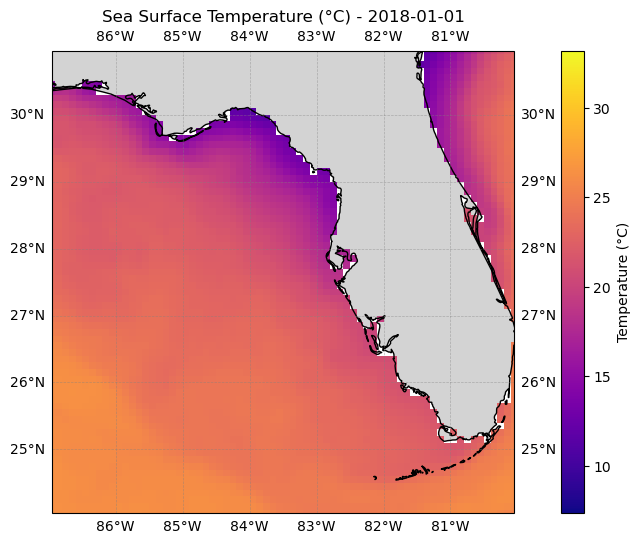

In [6]:
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
from IPython.display import HTML

# === 1. Load Dataset ===
file_path = 'Data/Project Data/cmems_obs-sst_glo_phy_my_l4_P1D-m_1744382931760.nc'  # Replace with your actual path
ds_sst = xr.open_dataset(file_path)

# === 2. Select SST variable and convert to Celsius ===
sst_var = 'analysed_sst'
if sst_var not in ds_sst.data_vars:
    raise ValueError(f"'{sst_var}' not found. Available: {list(ds_sst.data_vars)}")

sst = ds_sst[sst_var].sortby('latitude') - 273.15  # Convert from Kelvin to Celsius

# === 3. Grid edges for pcolormesh ===
def compute_edges(coord):
    mid = 0.5 * (coord[1:] + coord[:-1])
    first = coord[0] - (mid[0] - coord[0])
    last = coord[-1] + (coord[-1] - mid[-1])
    return np.concatenate([[first], mid, [last]])

lat = ds_sst['latitude'].values
lon = ds_sst['longitude'].values
lat_edges = compute_edges(lat)
lon_edges = compute_edges(lon)

# === 4. Set up figure and map ===
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw={'projection': ccrs.PlateCarree()})

# Background map features
ax.set_extent([lon.min(), lon.max(), lat.min(), lat.max()], crs=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')

# === 5. Initial plot ===
initial_sst = sst.isel(time=0).squeeze().values
vmin = float(sst.min())
vmax = float(sst.max())
mesh = ax.pcolormesh(lon_edges, lat_edges, initial_sst, cmap='plasma',
                     shading='auto', transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax)

cbar = plt.colorbar(mesh, ax=ax, orientation='vertical', label='Temperature (°C)')
title = ax.set_title(f"Sea Surface Temperature (°C) - {str(sst.time[0].values)[:10]}")

# === 6. Update function ===
def update(frame):
    sst_frame = sst.isel(time=frame).squeeze().values
    mesh.set_array(sst_frame.ravel())
    title.set_text(f"Sea Surface Temperature (°C) - {str(sst.time[frame].values)[:10]}")
    return mesh, title

# === 7. Create animation using monthly steps (~30 days apart)
frame_indices = list(range(0, sst.sizes['time'], 30))  # Approx. 1 frame per month
anim = animation.FuncAnimation(fig, update, frames=frame_indices, interval=500, blit=False)

# === 8. Save as GIF ===
anim.save("sea_surface_temperature_animation.gif", writer='pillow', fps=2)
print("Animation saved as 'sea_surface_temperature_animation.gif'")

# === 9. Display in Jupyter ===
HTML(anim.to_jshtml())


## 🔁 Repeating the Workflow for Other Variables

The same series of steps used for Sea Surface Temperature were **repeated for three additional variables** in the dataset:

```python
# ✅ Sea Surface Salinity (SSS)
# ✅ Chlorophyll Concentration
# ✅ Wind Speed


# Sea Surface Salinity

In [7]:
# === STEP 1: Check if the file exists and then load the NetCDF file ===
file_path = 'Data/Project Data/cmems_obs-mob_glo_phy-sss_my_multi_P1D_1744381008767.nc'

# Check if the file exists
if os.path.exists(file_path):
    # File exists, try to open it
    try:
        ds_sss = xr.open_dataset(file_path)
        # === STEP 2: View dataset structure ===
        print(ds_sss)
    except Exception as e:
        print(f"Error opening the file: {e}")
        print("The file might be corrupted or in an incompatible format.")
else:
    print(f"File not found: {file_path}")
    print("Please check the file path and make sure the file exists.")
    
    # You might want to list available files in the directory
    directory = os.path.dirname(file_path)
    if os.path.exists(directory):
        print(f"\nFiles in {directory}:")
        for f in os.listdir(directory):
            print(f"- {f}")
    else:
        print(f"\nDirectory not found: {directory}")

ds_sss

<xarray.Dataset>
Dimensions:    (time: 1277, depth: 1, latitude: 56, longitude: 56)
Coordinates:
  * time       (time) datetime64[ns] 2018-01-01 2018-01-02 ... 2021-06-30
  * depth      (depth) float32 -0.0
  * latitude   (latitude) float32 24.06 24.19 24.31 24.44 ... 30.69 30.81 30.94
  * longitude  (longitude) float32 -86.94 -86.81 -86.69 ... -80.31 -80.19 -80.06
Data variables:
    dos        (time, depth, latitude, longitude) float32 ...
    sos        (time, depth, latitude, longitude) float32 ...
Attributes:
    Conventions:       CF-1.11
    title:             Global Analysed Sea Surface Salinity and Density
    institution:       CNR
    contact:           servicedesk.cmems@mercator-ocean.eu
    references:        Buongiorno Nardelli, B., R. Droghei, and R. Santoleri ...
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  MULTIOBS_GLO_PHY_S_SURFACE_MYNRT_015_013
    subset:datasetId:  cmems_obs-mob_glo_phy-sss_my_multi_P1D_202

<xarray.Dataset>
Dimensions:    (time: 1277, depth: 1, latitude: 56, longitude: 56)
Coordinates:
  * time       (time) datetime64[ns] 2018-01-01 2018-01-02 ... 2021-06-30
  * depth      (depth) float32 -0.0
  * latitude   (latitude) float32 24.06 24.19 24.31 24.44 ... 30.69 30.81 30.94
  * longitude  (longitude) float32 -86.94 -86.81 -86.69 ... -80.31 -80.19 -80.06
Data variables:
    dos        (time, depth, latitude, longitude) float32 ...
    sos        (time, depth, latitude, longitude) float32 ...
Attributes:
    Conventions:       CF-1.11
    title:             Global Analysed Sea Surface Salinity and Density
    institution:       CNR
    contact:           servicedesk.cmems@mercator-ocean.eu
    references:        Buongiorno Nardelli, B., R. Droghei, and R. Santoleri ...
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  MULTIOBS_GLO_PHY_S_SURFACE_MYNRT_015_013
    subset:datasetId:  cmems_obs-mob_glo_phy-sss_my_multi_P1D_202311
    subset:date:       2025-04-11T14:16:48.768Z

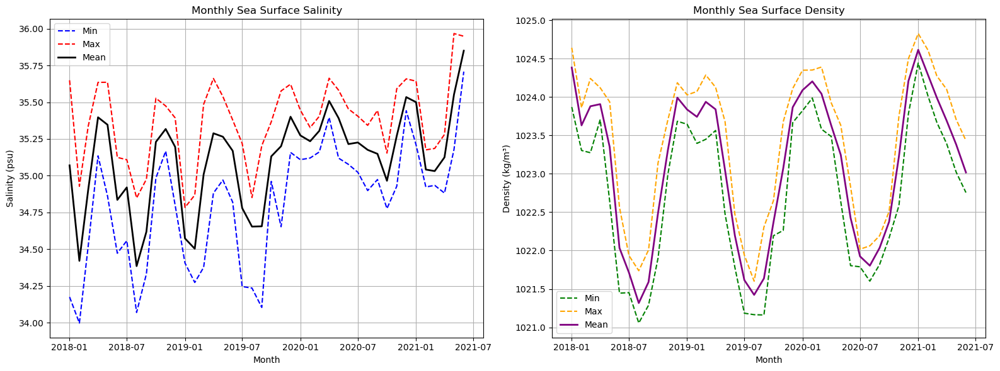


===== Monthly Sea Surface Salinity Statistics =====


,Minimum Salinity (psu),Maximum Salinity (psu),Mean Salinity (psu)
Month,,,
2018-01-01,34.174999,35.648998,35.070000
2018-02-01,33.998001,34.928001,34.421001
2018-03-01,34.522999,35.337002,34.905998
2018-04-01,35.134998,35.634998,35.396999
2018-05-01,34.862000,35.636002,35.347000



===== Monthly Sea Surface Density Statistics =====


,Minimum Density (kg/m³),Maximum Density (kg/m³),Mean Density (kg/m³)
Month,,,
2018-01-01,1023.869019,1024.641968,1024.384033
2018-02-01,1023.304016,1023.861023,1023.630981
2018-03-01,1023.273987,1024.241943,1023.880005
2018-04-01,1023.705994,1024.119995,1023.906982
2018-05-01,1022.643005,1023.937012,1023.348999


In [8]:
# === 1. Define variable names ===
salinity_var = 'sos'
density_var = 'dos'

# === 2. Validate variables exist ===
for var in [salinity_var, density_var]:
    if var not in ds_sss.data_vars:
        raise ValueError(f"'{var}' not found in ds_sss. Available: {list(ds_sss.data_vars)}")

# === 3. Extract and spatially average if needed ===
salinity = ds_sss[salinity_var]
density = ds_sss[density_var]

if 'latitude' in salinity.dims and 'longitude' in salinity.dims:
    salinity = salinity.mean(dim=['latitude', 'longitude'])

if 'latitude' in density.dims and 'longitude' in density.dims:
    density = density.mean(dim=['latitude', 'longitude'])

# === 4. Convert to DataFrames ===
sal_df = salinity.to_dataframe(name='salinity').reset_index()
den_df = density.to_dataframe(name='density').reset_index()

# === 5. Monthly groupings
sal_df['month'] = sal_df['time'].dt.to_period('M')
den_df['month'] = den_df['time'].dt.to_period('M')

sal_monthly = sal_df.groupby('month')['salinity'].agg(['min', 'max', 'mean']).reset_index()
den_monthly = den_df.groupby('month')['density'].agg(['min', 'max', 'mean']).reset_index()

sal_monthly['month'] = sal_monthly['month'].dt.to_timestamp()
den_monthly['month'] = den_monthly['month'].dt.to_timestamp()

# === 6. Plot side-by-side ===
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharex=True)

# --- Salinity plot ---
axes[0].plot(sal_monthly['month'], sal_monthly['min'], linestyle='--', label='Min', color='blue')
axes[0].plot(sal_monthly['month'], sal_monthly['max'], linestyle='--', label='Max', color='red')
axes[0].plot(sal_monthly['month'], sal_monthly['mean'], label='Mean', color='black', linewidth=2)
axes[0].set_title("Monthly Sea Surface Salinity")
axes[0].set_xlabel("Month")
axes[0].set_ylabel("Salinity (psu)")
axes[0].legend()
axes[0].grid(True)

# --- Density plot ---
axes[1].plot(den_monthly['month'], den_monthly['min'], linestyle='--', label='Min', color='green')
axes[1].plot(den_monthly['month'], den_monthly['max'], linestyle='--', label='Max', color='orange')
axes[1].plot(den_monthly['month'], den_monthly['mean'], label='Mean', color='purple', linewidth=2)
axes[1].set_title("Monthly Sea Surface Density")
axes[1].set_xlabel("Month")
axes[1].set_ylabel("Density (kg/m³)")
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()

# === Save figure as PNG ===
plt.savefig("monthly_salinity_density.png", dpi=300)

plt.show()

# === 7. Format column headers and display professionally ===

# Rename columns
sal_monthly.columns = ['Month', 'Minimum Salinity (psu)', 'Maximum Salinity (psu)', 'Mean Salinity (psu)']
den_monthly.columns = ['Month', 'Minimum Density (kg/m³)', 'Maximum Density (kg/m³)', 'Mean Density (kg/m³)']

# Round values for clean display
sal_monthly = sal_monthly.round(3)
den_monthly = den_monthly.round(3)

# Set 'Month' as index for neater formatting
sal_monthly.set_index('Month', inplace=True)
den_monthly.set_index('Month', inplace=True)

# Display salinity table with title
print("\n===== Monthly Sea Surface Salinity Statistics =====")
display(sal_monthly.head())

# Display density table with title
print("\n===== Monthly Sea Surface Density Statistics =====")
display(den_monthly.head())


## 🌊 Analyzing and Animating Multiple Variables (Sea Surface Salinity and Sea Surface Density)

This section focuses on processing and visualizing two critical oceanographic variables from a NetCDF file:
- **Sea Surface Salinity** (`sos`)
- **Sea Surface Density** (`dos`)

### 🧪 What This Code Does:

1. **Loads the dataset** containing daily measurements of salinity and density.
2. **Sorts variables by latitude** to ensure correct spatial orientation.
3. **Computes grid edges** from latitude and longitude arrays to accurately define pcolormesh boundaries.
4. **Creates static visualizations** of the first time slice for both salinity and density using `Cartopy`:
   - Includes coastlines, land features, borders, and labeled gridlines for geographic context.
5. **Sets up dual-panel animation** with consistent axes, showing temporal changes in both variables.
6. **Updates the animation** by changing the data shown at ~30-day intervals (monthly sampling).
7. **Displays the animation inline** using HTML rendering for notebooks.

> 📌 This dual animation provides an intuitive way to **observe how salinity and density evolve over time**, which can be key indicators of climate shifts, freshwater influx, or ocean circulation changes.


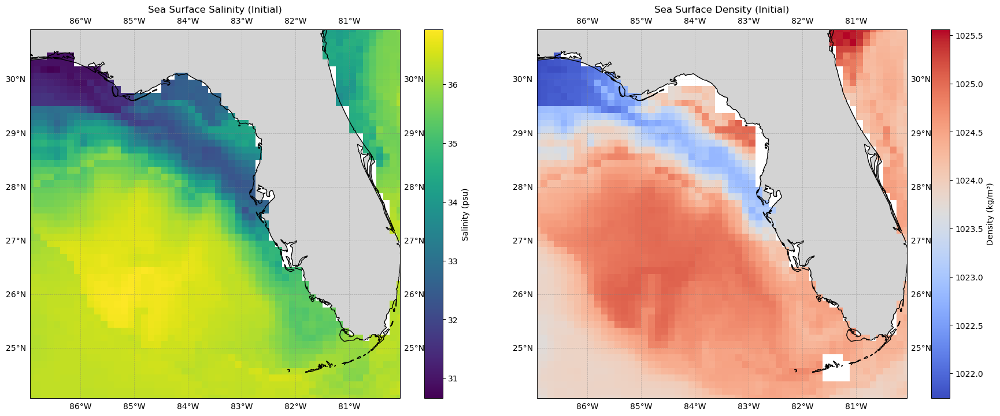

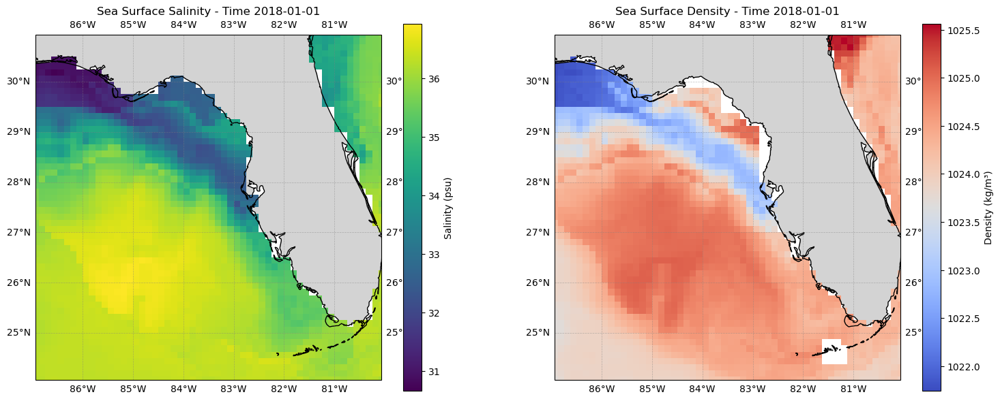

In [9]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib import animation
from IPython.display import HTML

# === 1. Load Dataset ===
file_path = 'Data/Project Data/cmems_obs-mob_glo_phy-sss_my_multi_P1D_1744381008767.nc'
ds = xr.open_dataset(file_path)

# === 2. Select and sort variables ===
sos = ds['sos'].sortby('latitude')
dos = ds['dos'].sortby('latitude')

# === 3. Compute grid edges ===
def compute_edges(coord):
    midpoints = 0.5 * (coord[1:] + coord[:-1])
    first = coord[0] - (midpoints[0] - coord[0])
    last = coord[-1] + (coord[-1] - midpoints[-1])
    return np.concatenate([[first], midpoints, [last]])

lon = ds['longitude'].values
lat = ds['latitude'].values
lon_edges = compute_edges(lon)
lat_edges = compute_edges(lat)

# === 4. Static plots for first time slice ===
def get_surface_slice(var):
    if 'time' in var.dims and 'depth' in var.dims:
        return var.isel(time=0, depth=0)
    elif 'time' in var.dims:
        return var.isel(time=0)
    else:
        return var

sos_static = get_surface_slice(sos)
dos_static = get_surface_slice(dos)

fig1, axes = plt.subplots(1, 2, figsize=(18, 7),
                          subplot_kw={'projection': ccrs.PlateCarree()})

for ax in axes:
    ax.set_extent([lon.min(), lon.max(), lat.min(), lat.max()], crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')

p1 = axes[0].pcolormesh(lon_edges, lat_edges, sos_static.values,
                        cmap='viridis', shading='auto', transform=ccrs.PlateCarree())
axes[0].set_title("Sea Surface Salinity (Initial)")
fig1.colorbar(p1, ax=axes[0], orientation='vertical', label='Salinity (psu)')

p2 = axes[1].pcolormesh(lon_edges, lat_edges, dos_static.values,
                        cmap='coolwarm', shading='auto', transform=ccrs.PlateCarree())
axes[1].set_title("Sea Surface Density (Initial)")
fig1.colorbar(p2, ax=axes[1], orientation='vertical', label='Density (kg/m³)')

plt.tight_layout()
plt.show()

# === Setup animation plot (unchanged axes) ===
fig2, axes_anim = plt.subplots(1, 2, figsize=(18, 7),
                               subplot_kw={'projection': ccrs.PlateCarree()})

for ax in axes_anim:
    ax.set_extent([lon.min(), lon.max(), lat.min(), lat.max()], crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')

# Create initial meshes (frame 0)
sos_data = sos.isel(time=0).squeeze()
dos_data = dos.isel(time=0).squeeze()

sos_mesh = axes_anim[0].pcolormesh(lon_edges, lat_edges, sos_data.values,
                                   cmap='viridis', shading='auto', transform=ccrs.PlateCarree())
dos_mesh = axes_anim[1].pcolormesh(lon_edges, lat_edges, dos_data.values,
                                   cmap='coolwarm', shading='auto', transform=ccrs.PlateCarree())

axes_anim[0].set_title("Sea Surface Salinity")
axes_anim[1].set_title("Sea Surface Density")

cbar1 = fig2.colorbar(sos_mesh, ax=axes_anim[0], orientation='vertical', label='Salinity (psu)')
cbar2 = fig2.colorbar(dos_mesh, ax=axes_anim[1], orientation='vertical', label='Density (kg/m³)')

# === Update function: update mesh data in-place ===
def update(frame):
    sos_frame = sos.isel(time=frame).squeeze().values
    dos_frame = dos.isel(time=frame).squeeze().values

    sos_mesh.set_array(sos_frame.ravel())
    dos_mesh.set_array(dos_frame.ravel())

    axes_anim[0].set_title(f"Sea Surface Salinity - Time {str(sos.time[frame].values)[:10]}")
    axes_anim[1].set_title(f"Sea Surface Density - Time {str(dos.time[frame].values)[:10]}")
    return sos_mesh, dos_mesh

# === Create animation with monthly (approx. 30-day) steps ===
frame_indices = list(range(0, sos.sizes['time'], 30))  # Adjust step if needed
anim = animation.FuncAnimation(fig2, update, frames=frame_indices, interval=600, blit=False)

# === Also display the animation below in notebook ===
HTML(anim.to_jshtml())


# Chlorophyll

In [10]:
# === STEP 1: Check if the file exists and then load the NetCDF file ===
file_path = 'Data/Project Data/cmems_obs-mob_glo_bgc-chl-poc_my_0.25deg_P7D-m_1744379762305.nc'

# Check if the file exists
if os.path.exists(file_path):
    # File exists, try to open it
    try:
        ds_chl = xr.open_dataset(file_path)
        # === STEP 2: View dataset structure ===
        print(ds_chl)
    except Exception as e:
        print(f"Error opening the file: {e}")
        print("The file might be corrupted or in an incompatible format.")
else:
    print(f"File not found: {file_path}")
    print("Please check the file path and make sure the file exists.")
    
    # You might want to list available files in the directory
    directory = os.path.dirname(file_path)
    if os.path.exists(directory):
        print(f"\nFiles in {directory}:")
        for f in os.listdir(directory):
            print(f"- {f}")
    else:
        print(f"\nDirectory not found: {directory}")

ds_chl

<xarray.Dataset>
Dimensions:    (time: 183, depth: 2, latitude: 28, longitude: 28)
Coordinates:
  * time       (time) datetime64[ns] 2018-01-03 2018-01-10 ... 2021-06-30
  * depth      (depth) float32 -0.0 5.0
  * latitude   (latitude) float32 24.12 24.38 24.62 24.88 ... 30.38 30.62 30.88
  * longitude  (longitude) float32 -86.88 -86.62 -86.38 ... -80.62 -80.38 -80.12
Data variables:
    chl        (time, depth, latitude, longitude) float32 ...
    bbp        (time, depth, latitude, longitude) float32 ...
Attributes:
    Conventions:       CF-1.11
    title:             Global Ocean 3D Chlorophyll-a concentration, Particula...
    institution:       LOV/IMEV/CNRS
    contact:           servicedesk.cmems@mercator-ocean.eu
    references:        Sauzede et al. 2016 (Journal of Geophysical Research; ...
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  MULTIOBS_GLO_BIO_BGC_3D_REP_015_010
    subset:datasetId:  cmems_obs-mob_glo_bgc-chl

<xarray.Dataset>
Dimensions:    (time: 183, depth: 2, latitude: 28, longitude: 28)
Coordinates:
  * time       (time) datetime64[ns] 2018-01-03 2018-01-10 ... 2021-06-30
  * depth      (depth) float32 -0.0 5.0
  * latitude   (latitude) float32 24.12 24.38 24.62 24.88 ... 30.38 30.62 30.88
  * longitude  (longitude) float32 -86.88 -86.62 -86.38 ... -80.62 -80.38 -80.12
Data variables:
    chl        (time, depth, latitude, longitude) float32 ...
    bbp        (time, depth, latitude, longitude) float32 ...
Attributes:
    Conventions:       CF-1.11
    title:             Global Ocean 3D Chlorophyll-a concentration, Particula...
    institution:       LOV/IMEV/CNRS
    contact:           servicedesk.cmems@mercator-ocean.eu
    references:        Sauzede et al. 2016 (Journal of Geophysical Research; ...
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  MULTIOBS_GLO_BIO_BGC_3D_REP_015_010
    subset:datasetId:  cmems_obs-mob_glo_bgc-chl-poc_my_0.25deg_P7D-m_202411
    subset:date:       2025-04-11T13:56:02.306Z

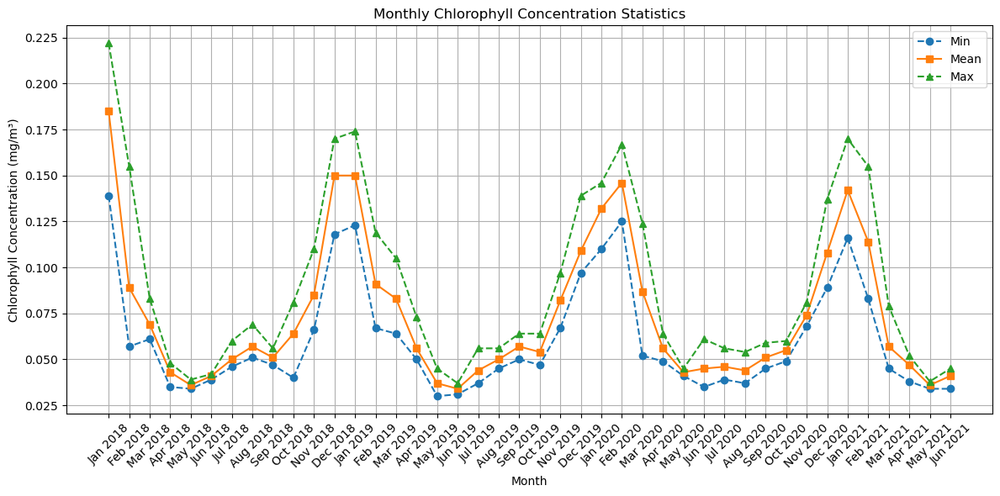

In [11]:
# === 1. Load the Chlorophyll variable from the Dataset ===
chl_var = 'chl'
if chl_var not in ds_chl.data_vars:
    raise ValueError(f"'{chl_var}' not found in dataset.")

chl = ds_chl[chl_var]

# === 2. Take spatial average if spatial dimensions exist ===
if 'latitude' in chl.dims and 'longitude' in chl.dims:
    chl = chl.mean(dim=['latitude', 'longitude'])

# === 3. Convert to DataFrame ===
chl_df = chl.to_dataframe(name='Chlorophyll').reset_index()

# === 4. Group by month and calculate statistics ===
chl_df['Month'] = chl_df['time'].dt.to_period('M')
monthly_stats = chl_df.groupby('Month')['Chlorophyll'].agg(['min', 'max', 'mean']).reset_index()

# === 5. Format DataFrame for better appearance ===
monthly_stats['Month'] = monthly_stats['Month'].dt.strftime('%b %Y')
monthly_stats.columns = ['Month', 'Minimum (mg/m³)', 'Maximum (mg/m³)', 'Mean (mg/m³)']
monthly_stats = monthly_stats.round(3)  # Round all values to 3 decimal places

# === 6. Plot the Monthly Statistics ===
plt.figure(figsize=(12, 6))
plt.plot(monthly_stats['Month'], monthly_stats['Minimum (mg/m³)'], label='Min', linestyle='--', marker='o')
plt.plot(monthly_stats['Month'], monthly_stats['Mean (mg/m³)'], label='Mean', linestyle='-', marker='s')
plt.plot(monthly_stats['Month'], monthly_stats['Maximum (mg/m³)'], label='Max', linestyle='--', marker='^')
plt.title('Monthly Chlorophyll Concentration Statistics')
plt.xlabel('Month')
plt.ylabel('Chlorophyll Concentration (mg/m³)')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()

# === Show the plot ===
plt.show()

# Wind Speed

In [12]:
# === STEP 1: Check if the file exists and then load the NetCDF file ===
file_path = 'Data/Project Data/cmems_obs-wind_glo_phy_nrt_l3-metopa-ascat-asc-0.125deg_P1D-i_1744379148089.nc'

# Check if the file exists
if os.path.exists(file_path):
    # File exists, try to open it
    try:
        ds_wnd = xr.open_dataset(file_path)
        # === STEP 2: View dataset structure ===
        print(ds_wnd)
    except Exception as e:
        print(f"Error opening the file: {e}")
        print("The file might be corrupted or in an incompatible format.")
else:
    print(f"File not found: {file_path}")
    print("Please check the file path and make sure the file exists.")
    
    # You might want to list available files in the directory
    directory = os.path.dirname(file_path)
    if os.path.exists(directory):
        print(f"\nFiles in {directory}:")
        for f in os.listdir(directory):
            print(f"- {f}")
    else:
        print(f"\nDirectory not found: {directory}")

ds_wnd

<xarray.Dataset>
Dimensions:           (time: 1277, latitude: 56, longitude: 56)
Coordinates:
  * time              (time) datetime64[ns] 2018-01-01 2018-01-02 ... 2021-06-30
  * latitude          (latitude) float32 24.06 24.19 24.31 ... 30.69 30.81 30.94
  * longitude         (longitude) float32 -86.94 -86.81 -86.69 ... -80.19 -80.06
Data variables:
    measurement_time  (time, latitude, longitude) datetime64[ns] ...
    wind_speed        (time, latitude, longitude) float32 ...
Attributes:
    Conventions:       CF-1.11
    title:             Global Ocean - Wind - METOP-A ASCAT - 12km daily Ascen...
    institution:       EUMETSAT/OSI SAF/KNMI
    source:            MetOp-A ASCAT
    history:           N/A
    references:        ASCAT Wind Product User Manual, http://www.osi-saf.org...
    comment:           Orbit period and inclination are constant values. All ...
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  WIND_GLO_PHY_L3_N

<xarray.Dataset>
Dimensions:           (time: 1277, latitude: 56, longitude: 56)
Coordinates:
  * time              (time) datetime64[ns] 2018-01-01 2018-01-02 ... 2021-06-30
  * latitude          (latitude) float32 24.06 24.19 24.31 ... 30.69 30.81 30.94
  * longitude         (longitude) float32 -86.94 -86.81 -86.69 ... -80.19 -80.06
Data variables:
    measurement_time  (time, latitude, longitude) datetime64[ns] ...
    wind_speed        (time, latitude, longitude) float32 ...
Attributes:
    Conventions:       CF-1.11
    title:             Global Ocean - Wind - METOP-A ASCAT - 12km daily Ascen...
    institution:       EUMETSAT/OSI SAF/KNMI
    source:            MetOp-A ASCAT
    history:           N/A
    references:        ASCAT Wind Product User Manual, http://www.osi-saf.org...
    comment:           Orbit period and inclination are constant values. All ...
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  WIND_GLO_PHY_L3_NRT_012_002
    subset:datasetId:  cmems_obs-wind_glo_phy_nrt_l3-metopa-ascat-asc-0.125de...
    subset:date:       2025-04-11T13:45:48.089Z

## 🌬️ Visualizing Wind Speed Trends Over Time

This section extracts and analyzes **wind speed data** from a NetCDF file, producing a clean and informative **time series plot**.

### 🌟 What This Code Does:

1. **Loads the wind dataset** from a `.nc` file containing daily near-real-time satellite observations.
2. **Extracts the `wind_speed` variable** and corresponding `time` values.
3. **Calculates a spatial average** across all non-time dimensions (if present), resulting in a single time series.
4. **Converts the time values** into a NumPy datetime format for plotting.
5. **Creates a static line plot** showing wind speed trends over time using `matplotlib`:
   - X-axis: Time
   - Y-axis: Wind Speed (m/s)
   - Labels and title included for clarity

> 📌 This visualization is particularly useful for identifying **temporal patterns in wind activity**, such as seasonal changes, storm events, or anomalies during specific periods.


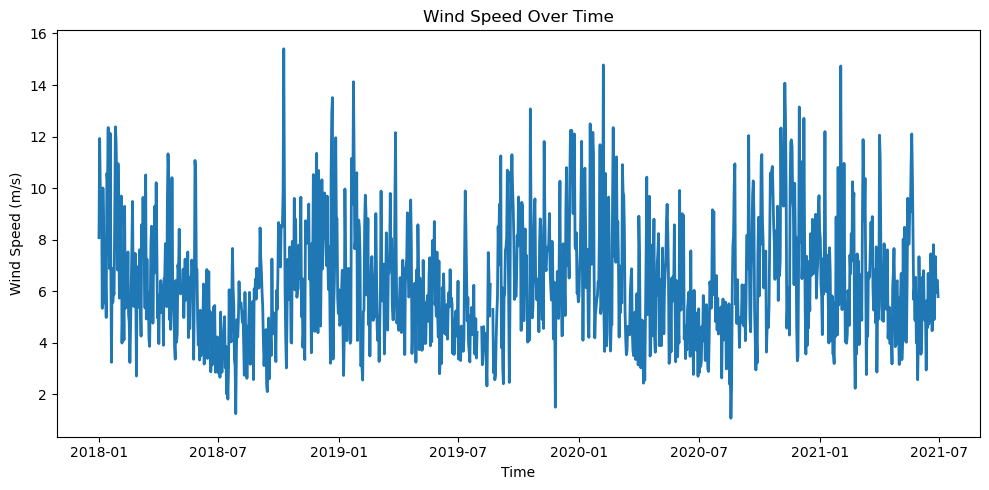

In [13]:
# === 1. Load your Dataset ===
file_path = 'Data/Project Data/cmems_obs-wind_glo_phy_nrt_l3-metopa-ascat-asc-0.125deg_P1D-i_1744379148089.nc'
ds_wnd = xr.open_dataset(file_path)

# === 2. Extract wind speed and time ===
wind = ds_wnd['wind_speed']  # Adjust variable name if needed
time = ds_wnd['time']

# If wind has multiple dimensions (e.g., time, lat, lon), take spatial average
if wind.ndim > 1:
    wind = wind.mean(dim=[dim for dim in wind.dims if dim != 'time'])

# Convert time to numpy datetime
time = np.array(time.values)

# === 3. Plot static time series ===
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(time, wind, lw=2)
ax.set_xlabel('Time')
ax.set_ylabel('Wind Speed (m/s)')
ax.set_title('Wind Speed Over Time')
plt.tight_layout()
plt.show()


===== Monthly Wind Speed Summary (m/s) =====


,Min Wind Speed (m/s),Max Wind Speed (m/s),Mean Wind Speed (m/s)
Month,,,
2018-01-01,3.24,12.38,8.45
2018-02-01,2.70,9.69,6.14
2018-03-01,3.85,10.51,6.84
2018-04-01,3.36,11.33,6.12
2018-05-01,3.35,11.07,6.46


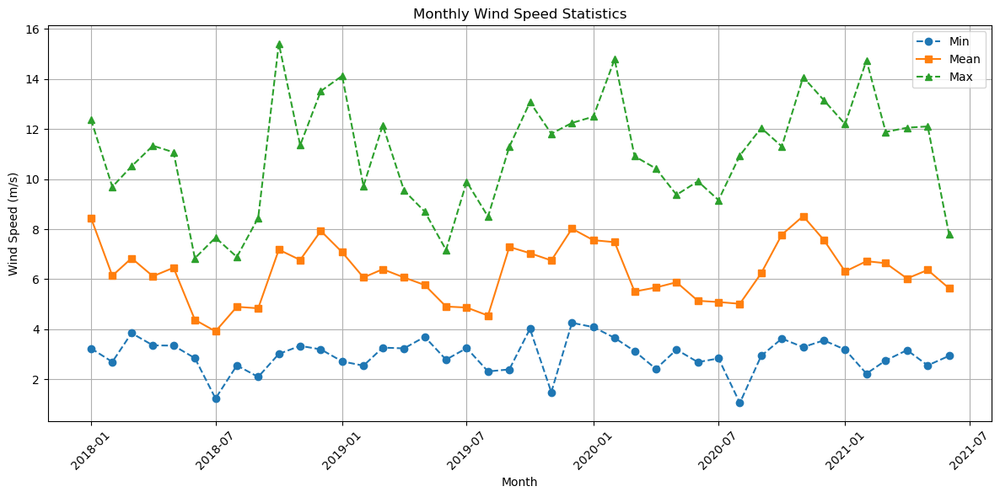

In [14]:
# === 1. Validate Variables ===
if 'wind_speed' not in ds_wnd.data_vars or 'time' not in ds_wnd.coords:
    raise ValueError("Variables 'wind_speed' or 'time' not found in ds_wnd")

# === 2. Extract wind speed and time ===
wind = ds_wnd['wind_speed']
time = ds_wnd['time']

# === 3. Assign time as coordinate if not already ===
if 'time' not in wind.coords:
    wind = wind.assign_coords(time=time)

# === 4. Average over spatial dimensions if necessary ===
spatial_dims = [dim for dim in ['latitude', 'longitude'] if dim in wind.dims]
if spatial_dims:
    wind = wind.mean(dim=spatial_dims)

# === 5. Convert to DataFrame ===
wind_df = wind.to_dataframe(name='Wind Speed').reset_index()

# === 6. Convert to Monthly Summary ===
wind_df['Month'] = wind_df['time'].dt.to_period('M')
monthly_stats = wind_df.groupby('Month')['Wind Speed'].agg(['min', 'max', 'mean']).reset_index()
monthly_stats['Month'] = monthly_stats['Month'].dt.to_timestamp()

# === 7. Clean DataFrame for display ===
monthly_stats.columns = ['Month', 'Min Wind Speed (m/s)', 'Max Wind Speed (m/s)', 'Mean Wind Speed (m/s)']
monthly_stats = monthly_stats.round(2)

# === 8. Plot the Monthly Wind Speed Statistics ===
plt.figure(figsize=(12, 6))
plt.plot(monthly_stats['Month'], monthly_stats['Min Wind Speed (m/s)'], label='Min', linestyle='--', marker='o')
plt.plot(monthly_stats['Month'], monthly_stats['Mean Wind Speed (m/s)'], label='Mean', linestyle='-', marker='s')
plt.plot(monthly_stats['Month'], monthly_stats['Max Wind Speed (m/s)'], label='Max', linestyle='--', marker='^')

plt.title("Monthly Wind Speed Statistics")
plt.xlabel("Month")
plt.ylabel("Wind Speed (m/s)")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()

# === 9. Display Summary Table ===
from IPython.display import display
print("\n===== Monthly Wind Speed Summary (m/s) =====")
monthly_stats.set_index('Month', inplace=True)
display(monthly_stats.head())


# **DATA PREPARATION FOR STATISTICAL ANALYSIS**

## 📍 Extracting Regional Mean Time Series for the Florida Keys

This step isolates environmental variables **specific to the Florida Keys region** and calculates the average value across space for each time step, resulting in **regional time series**.

### 🗺️ What This Code Does:

1. **Defines a bounding box** for the Florida Keys:
   - Latitude: `24°N` to `31°N`
   - Longitude: `87°W` to `80°W`
2. **Implements a reusable function** `extract_mean_timeseries()` that:
   - Selects data within the specified lat/lon bounds.
   - Computes the **spatial mean** across the selected region.
   - Converts the result into a **Pandas Series** for easier plotting and analysis.
3. **Applies this function** to extract regionally averaged time series for:
   - 🌡️ **Sea Surface Temperature** (`analysed_sst`)
   - 🧂 **Sea Surface Salinity** (`sos`)
   - 🌱 **Chlorophyll concentration** (`chl`, surface level only)
   - 🌬️ **Wind Speed** (`wind_speed`)

> 📌 This process provides **region-specific insights** into how oceanographic and atmospheric conditions evolve over time, helping you focus your analysis on the **Florida Keys ecosystem**.


In [32]:
import xarray as xr
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
import seaborn as sns

# Florida Keys bounding box
lat_min, lat_max = 24, 31
lon_min, lon_max = -87, -80

def extract_mean_timeseries(ds, var_name, lat_name='lat', lon_name='lon'):
    # Select regional subset
    ds_region = ds.sel(
        **{
            lat_name: slice(lat_min, lat_max),
            lon_name: slice(lon_min, lon_max)
        }
    )
    # Spatial average
    var_mean = ds_region[var_name].mean(dim=[lat_name, lon_name], skipna=True)
    return var_mean.to_series()

ds_sst = xr.open_dataset("Data/Project Data/cmems_obs-sst_glo_phy_my_l4_P1D-m_1744382931760.nc")
ds_sss = xr.open_dataset("Data/Project Data/cmems_obs-mob_glo_phy-sss_my_multi_P1D_1744381008767.nc")
ds_wnd = xr.open_dataset("Data/Project Data/cmems_obs-wind_glo_phy_nrt_l3-metopa-ascat-asc-0.125deg_P1D-i_1744379148089.nc")
ds_chl = xr.open_dataset("Data/Project Data/cmems_obs-mob_glo_bgc-chl-poc_my_0.25deg_P7D-m_1744379762305.nc")

# Select surface layer (depth = 0) before extracting the mean
chl_surface = ds_chl.sel(depth=0)
ts_chl = extract_mean_timeseries(chl_surface, 'chl', lat_name='latitude', lon_name='longitude')

# SST (Sea Surface Temperature)
ts_sst = extract_mean_timeseries(ds_sst, 'analysed_sst', lat_name='latitude', lon_name='longitude')

# SSS (Sea Surface Salinity)
ts_sss = extract_mean_timeseries(ds_sss, 'sos', lat_name='latitude', lon_name='longitude')

# Wind Speed
ts_wnd = extract_mean_timeseries(ds_wnd, 'wind_speed', lat_name='latitude', lon_name='longitude')

# Chlorophyll (after selecting surface depth)
chl_surface = ds_chl.sel(depth=0)
ts_chl = extract_mean_timeseries(chl_surface, 'chl', lat_name='latitude', lon_name='longitude')

# Fix ts_sss only
ts_sss = ts_sss.droplevel('depth')

## 📊 Weekly Resampling and Correlation Analysis

This step explores the **relationships between key environmental variables** in the Florida Keys by computing their **Pearson correlation coefficients** based on weekly averages.

### 🔍 What This Code Does:

1. **Resamples each variable's time series** (SST, salinity, wind speed, and chlorophyll) to a **weekly frequency** using the `.resample('W')` method and computes the mean for each week.
2. **Combines all variables into a single DataFrame**, making it easy to perform multivariate analysis.
3. **Cleans the data** by removing any rows with missing values to ensure accurate correlation computations.
4. **Calculates the Pearson correlation matrix**, which quantifies the strength and direction of linear relationships between variable pairs.
5. **Visualizes the correlation matrix** as a heatmap using `Seaborn`, with:
   - Color-coded cells to indicate correlation strength.
   - Numeric annotations showing exact correlation values.
6. **Saves the heatmap** as a high-resolution image for use in presentations or reports.

> 📌 This correlation matrix is essential for understanding **interdependencies between environmental factors**, which may help explain ecological trends or anomalies in the Florida Keys.


In [33]:
# No need to drop anything!

# Now resample all
ts_sss = ts_sss.resample('W').mean()
ts_sst = ts_sst.resample('W').mean()
ts_wnd = ts_wnd.resample('W').mean()
ts_chl = ts_chl.resample('W').mean()

# Now build the DataFrame
df = pd.concat([ts_sst, ts_sss, ts_wnd, ts_chl], axis=1)
df.columns = ['SST', 'Salinity', 'WindSpeed', 'Chlorophyll']
df = df.dropna()

df.head()


,SST,Salinity,WindSpeed,Chlorophyll
time,,,,
2018-01-07,294.959442,35.521057,9.207242,0.139266
2018-01-14,294.329102,35.445202,7.579513,0.153744
2018-01-21,293.727051,35.025776,8.188546,0.191080
2018-01-28,293.571106,34.607216,8.721270,0.219562
2018-02-04,293.632782,34.242214,8.167737,0.216236


# **Pearson Correlation**

## 🔬 Detailed Correlation Significance Analysis

This step provides a **deeper statistical analysis** of the relationships between environmental variables by calculating both the **Pearson correlation coefficient (`r`)** and the associated **p-value** for each variable pair.

### 🧠 What This Code Does:

1. **Loops through all unique pairs** of variables in the dataset (e.g., SST vs. Salinity, SST vs. Wind Speed, etc.), avoiding redundant or self-comparisons.
2. **Calculates the Pearson correlation coefficient (`r`)** for each pair, which measures the strength and direction of the linear relationship.
3. **Computes the p-value** to assess the **statistical significance** of the correlation:
   - A small p-value (typically < 0.05) indicates that the observed correlation is **unlikely due to chance**.
4. **Stores the results** (variable names, `r`, and `p-value`) in a structured list.
5. **Converts the list to a Pandas DataFrame** for tabular display and sorting.
6. **Sorts the correlations** by the absolute value of `r`, bringing the strongest relationships (positive or negative) to the top of the table.

> 📌 This analysis adds statistical rigor to your interpretation, helping to **prioritize variable relationships** that are both strong and statistically significant.


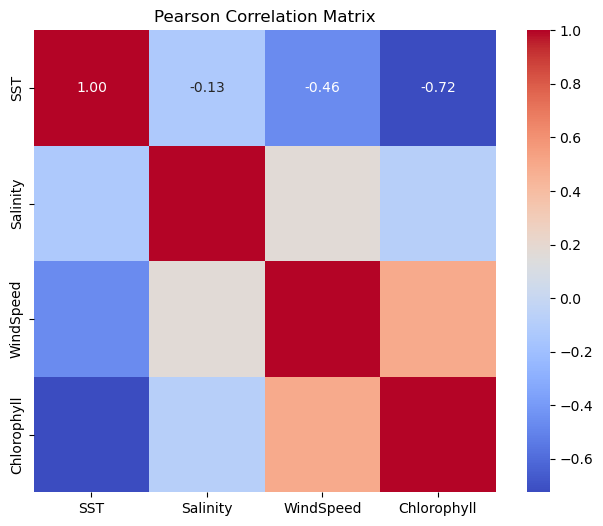

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = df.corr(method='pearson')

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title("Pearson Correlation Matrix")

plt.savefig("Pearson_correlation", dpi=300, bbox_inches='tight')


plt.show()


## Pearson Correlation Calculation Between All Variable Pairs

This code block computes the **Pearson correlation coefficient** and corresponding **p-value** between all unique pairs of variables in a DataFrame `df`. Here's a step-by-step breakdown:

1. **Import Pearson correlation function**:
   - The `pearsonr` function from `scipy.stats` is used to calculate the Pearson correlation coefficient (`r`) and its statistical significance (`p-value`) between two arrays.

2. **Initialize storage**:
   - An empty list called `results` is created to store the correlation results.
   - The list of column names from the DataFrame `df` is stored in `cols`.

3. **Loop through all unique variable pairs**:
   - A nested loop structure is used:
     - The outer loop iterates over each variable index `i`.
     - The inner loop iterates from the next variable index `j = i+1` onward to avoid repeating pairs or correlating a variable with itself.
   - For each unique pair (`var1`, `var2`):
     - Compute the Pearson correlation coefficient `r` and the associated `p-value` using `pearsonr(df[var1], df[var2])`.
     - Append a tuple `(var1, var2, r, p)` to the `results` list.

4. **Create a DataFrame of the results**:
   - After all correlations are computed, a new DataFrame `cor_df` is created with columns:
     - `"Variable 1"`, `"Variable 2"`, `"Pearson r"`, and `"p-value"`.

5. **Sort the correlation results**:
   - `cor_df` is sorted by the absolute value of the Pearson correlation coefficient (`|r|`), in descending order. This highlights the strongest positive or negative correlations at the top.

6. **Display the sorted table**:
   - Finally, the sorted correlation DataFrame `cor_df` is output, showing which variable pairs are most strongly correlated.

---


In [35]:
from scipy.stats import pearsonr

results = []
cols = df.columns

for i in range(len(cols)):
    for j in range(i+1, len(cols)):
        var1, var2 = cols[i], cols[j]
        r, p = pearsonr(df[var1], df[var2])
        results.append((var1, var2, r, p))

cor_df = pd.DataFrame(results, columns=["Variable 1", "Variable 2", "Pearson r", "p-value"])
cor_df = cor_df.sort_values("Pearson r", key=abs, ascending=False)
cor_df


,Variable 1,Variable 2,Pearson r,p-value
2,SST,Chlorophyll,-0.724758,4.249228e-31
5,WindSpeed,Chlorophyll,0.493931,1.201280e-12
1,SST,WindSpeed,-0.464646,3.451220e-11
3,Salinity,WindSpeed,0.166772,2.404466e-02
0,SST,Salinity,-0.127157,8.628416e-02
4,Salinity,Chlorophyll,-0.080179,2.806101e-01


# **PLOTTING OUR DATA**

## 📊 Time Series Plot of Environmental Variables Highlighting the Lockdown Period

This code block creates a **stacked time series plot** showing how four environmental variables changed over time from 2018–2021, while **highlighting the COVID-19 lockdown period**. Here's the breakdown:

1. **Define the lockdown period**:
   - `lockdown_start = "2020-03-01"` and `lockdown_end = "2020-09-15"` specify the time window for the lockdown (March 1, 2020 to September 15, 2020).

2. **Set up the plotting environment**:
   - `fig, axs = plt.subplots(4, 1, figsize=(14, 16), sharex=True)` creates a figure with 4 vertically stacked subplots (one for each variable), sharing the same x-axis (date).

3. **Loop through each variable and plot**:
   - The `for` loop iterates through the DataFrame columns (`df.columns`), plotting each variable's values over time.
   - `axs[i].plot(...)` plots each variable as a line with blue markers (small circles) for each point.

4. **Highlight the lockdown period**:
   - `axs[i].axvspan(lockdown_start, lockdown_end, color='red', alpha=0.2, label='Lockdown Period')` shades the background between the lockdown start and end dates in light red to indicate the lockdown period.

5. **Customize each subplot**:
   - Each subplot has its own y-axis label (`set_ylabel`) corresponding to the variable name.
   - Legends are added to identify the variable and lockdown shading (`legend(loc='upper right')`).
   - Gridlines are enabled (`grid(True)`) to make it easier to read the plot.

6. **Finalize the overall figure**:
   - `plt.suptitle("Weekly Time Series of Environmental Variables (2018–2021)")` adds a main title for all subplots.
   - `plt.xlabel("Date")` sets a shared x-axis label.
   - `plt.tight_layout(rect=[0, 0, 1, 0.97])` adjusts subplot spacing to prevent overlaps.

7. **Save and display the plot**:
   - `plt.savefig("time_series_plot.png", dpi=300, bbox_inches='tight')` saves the figure as a high-resolution `.png` image.
   - `plt.show()` displays the final visualization.

---


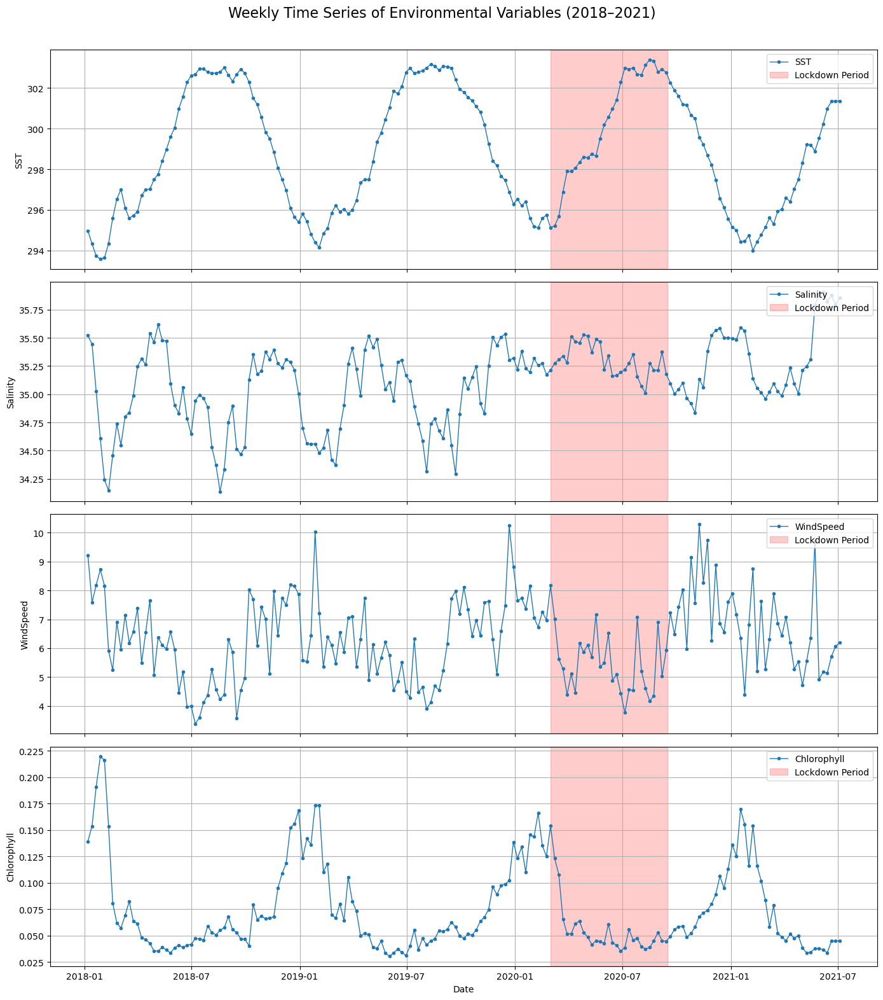

In [37]:
lockdown_start = "2020-03-01"
lockdown_end = "2020-09-15"

import matplotlib.pyplot as plt

# Lockdown period (updated)
lockdown_start = "2020-03-01"
lockdown_end = "2020-09-15"

# Create 4 stacked plots
fig, axs = plt.subplots(4, 1, figsize=(14, 16), sharex=True)

# Loop through each variable
for i, col in enumerate(df.columns):
    axs[i].plot(df.index, df[col], label=col, color='tab:blue', marker='o', markersize=3, linewidth=1)
    axs[i].axvspan(lockdown_start, lockdown_end, color='red', alpha=0.2, label='Lockdown Period')
    axs[i].set_ylabel(col)
    axs[i].legend(loc='upper right')
    axs[i].grid(True)

plt.suptitle("Weekly Time Series of Environmental Variables (2018–2021)", fontsize=16)
plt.xlabel("Date")
plt.tight_layout(rect=[0, 0, 1, 0.97])

plt.savefig("time_series_plot.png", dpi=300, bbox_inches='tight')


plt.show()


## 🌊 Sea Surface Temperature (SST) Anomaly Detection and Visualization (8-Week Rolling)

This code block identifies **anomalies** in Sea Surface Temperature (SST) based on an **8-week rolling window** and visually highlights them. Here's the detailed explanation:

1. **Calculate rolling statistics**:
   - `df.rolling(window=8, center=True).mean()` computes the 8-week **centered rolling mean** for smoothing out short-term fluctuations.
   - `df.rolling(window=8, center=True).std()` computes the 8-week **centered rolling standard deviation** to measure typical variation around the rolling mean.

2. **Detect anomalies**:
   - `df_anom = (df - df_rolling).abs() > (2 * df_std)` creates a **Boolean mask**: it marks a value as an anomaly (`True`) if it deviates more than **2 standard deviations** (`±2σ`) from the rolling mean.

3. **Convert SST from Kelvin to Celsius**:
   - `df['SST_C'] = df['SST'] - 273.15` converts the raw SST values into Celsius for easier interpretation.
   - Similarly, `df_rolling['SST_C'] = df_rolling['SST'] - 273.15` converts the rolling mean SST to Celsius.

4. **Create the plot**:
   - A figure (`plt.figure(figsize=(12, 4))`) is initialized with a wide format for clear time-series visualization.
   - `plt.plot(df.index, df['SST_C'], ...)` plots the actual SST values in Celsius.
   - `plt.plot(df.index, df_rolling['SST_C'], ...)` overlays the 8-week rolling mean.
   - `plt.scatter(...)` highlights detected anomalies (red dots) based on where the Boolean mask `df_anom['SST']` is `True`.
   - `plt.axvspan(lockdown_start, lockdown_end, ...)` shades the COVID-19 lockdown period in light red.

5. **Add labels, legend, and grid**:
   - Title: `"SST with Anomalies (°C, ±2σ Rolling)"` explains what the plot shows.
   - Y-axis is labeled `"SST (°C)"`.
   - A legend identifies SST, Rolling Mean, Anomalies, and Lockdown period.
   - Gridlines are added for better readability.

6. **Save and display the plot**:
   - The plot is saved as a high-resolution PNG file: `"sst_celsius_anomalies.png"`.
   - `plt.show()` renders the final figure.

---


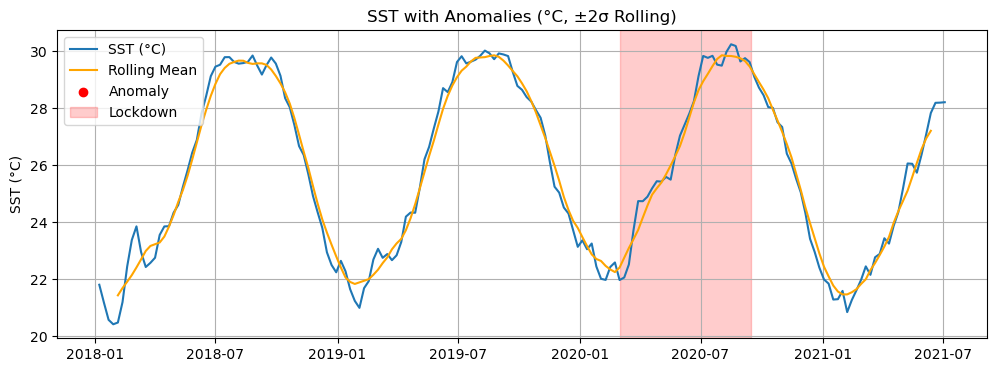

In [39]:
# 8-week rolling window (centered)
df_rolling = df.rolling(window=8, center=True).mean()
df_std = df.rolling(window=8, center=True).std()

# Boolean mask: True where anomaly exists
df_anom = (df - df_rolling).abs() > (2 * df_std)

df['SST_C'] = df['SST'] - 273.15
df_rolling['SST_C'] = df_rolling['SST'] - 273.15

plt.figure(figsize=(12, 4))
plt.plot(df.index, df['SST_C'], label='SST (°C)', color='tab:blue')
plt.plot(df.index, df_rolling['SST_C'], label='Rolling Mean', color='orange')
plt.scatter(df.index[df_anom['SST']], df['SST_C'][df_anom['SST']], color='red', label='Anomaly', zorder=5)
plt.axvspan(lockdown_start, lockdown_end, color='red', alpha=0.2, label='Lockdown')
plt.title("SST with Anomalies (°C, ±2σ Rolling)")
plt.ylabel("SST (°C)")
plt.legend()
plt.grid(True)

plt.savefig("sst_celsius_anomalies.png", dpi=300, bbox_inches='tight')

plt.show()
